## Reset Previous Work

In [1]:
pth = "/bigstore/GeneralStorage/fangming/projects/test_merfish/data"

In [2]:
from MERFISH_Objects.execute_class import *
import shutil

2022-08-22 15:19:43,087 [INFO] WRITING LOG OUTPUT TO /home/fangming/.cellpose/run.log


In [3]:
import importlib
# importlib.reload(MERFISH_Objects.execute_class)

In [4]:
metadata_path = '/bigstore/Images2022/Gaby/Zebrafinch/Zebra_B0_2022Jul11/'
dataset = [i for i in metadata_path.split('/') if not i==''][-1]
cword_config = 'merfish_config_zebrafinch_24bits'
config = importlib.import_module(cword_config)
parameters = config.parameters
fishdata_path = os.path.join(metadata_path, parameters['fishdata'])
utilities_path = parameters['utilities_path']

In [5]:
for key in parameters:
    if key.endswith('path') or key.endswith('data'):
        print(key, parameters[key])

daemon_path /scratch/test_daemon_FX
utilities_path /scratch/test_merfish_FX
fishdata fishdata_testFX


In [6]:
import time
from tqdm import trange
import pandas as pd
from collections import Counter
import numpy as np
from Bio import SeqIO

In [9]:
# from MERFISH_Objects.execute_class import *
# metadata_path = '/bigstore/Images2022/Gaby/Zebrafinch/Zebra_B0_2022Jul11/'
# dataset = [i for i in metadata_path.split('/') if not i==''][-1]
# cword_config = 'merfish_config_zebrafinch'
# config = importlib.import_module(cword_config)
bitmap = config.bitmap
# parameters = config.parameters

In [10]:
bitmap

[('RS0095_cy5', 'hybe1', 'FarRed'),
 ('RS0109_cy5', 'hybe2', 'FarRed'),
 ('RS0175_cy5', 'hybe3', 'FarRed'),
 ('RS0237_cy5', 'hybe4', 'FarRed'),
 ('RS0307_cy5', 'hybe5', 'FarRed'),
 ('RS0332_cy5', 'hybe6', 'FarRed'),
 ('RSN9927.0_cy5', 'hybe7', 'FarRed'),
 ('RSN2336.0_cy5', 'hybe8', 'FarRed'),
 ('RSN1807.0_cy5', 'hybe9', 'FarRed'),
 ('RS0384_cy5', 'hybe10', 'FarRed'),
 ('RS0406_cy5', 'hybe11', 'FarRed'),
 ('RS0451_cy5', 'hybe12', 'FarRed'),
 ('RS0468_cy5', 'hybe13', 'FarRed'),
 ('RS0548_cy5', 'hybe14', 'FarRed'),
 ('RS64.0_cy5', 'hybe15', 'FarRed'),
 ('RSN4287.0_cy5', 'hybe16', 'FarRed'),
 ('RSN1252.0_cy5', 'hybe17', 'FarRed'),
 ('RSN9535.0_cy5', 'hybe18', 'FarRed'),
 ('RS156.0_cy5', 'hybe19', 'FarRed'),
 ('RS278.0_cy5', 'hybe20', 'FarRed'),
 ('RS313.0_cy5', 'hybe21', 'FarRed'),
 ('RS643.0_cy5', 'hybe22', 'FarRed'),
 ('RS740.0_cy5', 'hybe23', 'FarRed'),
 ('RS810.0_cy5', 'hybe24', 'FarRed')]

In [11]:
posname = '7-Pos004_003'#image_metadata.posnames[0]

# Process Single Position

In [12]:
%%time
self = Dataset_Class(metadata_path, dataset, cword_config, verbose=True)
self.main()

15:19:58 Checking Imaging: 0it [00:00, ?it/s]
15:19:58 Checking Hot Pixel: 0it [00:00, ?it/s]
15:19:58 Checking Position Flags: 100%|██████████| 150/150 [00:00<00:00, 1392.21it/s]

CPU times: user 102 ms, sys: 51.4 ms, total: 153 ms
Wall time: 205 ms


### Image

In [13]:
def pfunc(data):
    hybe = data['hybe']
    channel = data['channel']
    zindex = data['zindex']
    self = Image_Class(metadata_path,dataset,posname,hybe,channel,zindex,cword_config,verbose=False)
    self.main()

In [16]:
%%time
Input = []
hybe = 'hybe2'
channel = 'FarRed'
self = Stack_Class(metadata_path,dataset,posname,hybe,channel,cword_config,verbose=False)
self.check_projection()
zindexes = self.zindexes
for readout_probe,hybe,channel in bitmap:
    for zindex in zindexes:
        data = {'hybe':hybe,'channel':channel,'zindex':zindex}
        Input.append(data)

ncpu = 30
pool = multiprocessing.Pool(ncpu)
sys.stdout.flush()
results = pool.imap(pfunc, Input)
iterable = tqdm(results,total=len(Input),desc=str(datetime.now().strftime("%H:%M:%S"))+' '+dataset,position=0)
for i in iterable:
    pass
pool.close()
sys.stdout.flush()

15:20:21 Zebra_B0_2022Jul11: 100%|██████████| 24/24 [05:54<00:00, 14.77s/it]  

CPU times: user 179 ms, sys: 589 ms, total: 767 ms
Wall time: 5min 55s


##### Visual Check

In [17]:
x_window = [500,750]
y_window = [1000,1250]

In [18]:
hybe1 = [i for i in os.listdir(metadata_path) if 'hybe1_' in i][-1]
image_metadata = Metadata(os.path.join(metadata_path,hybe1))

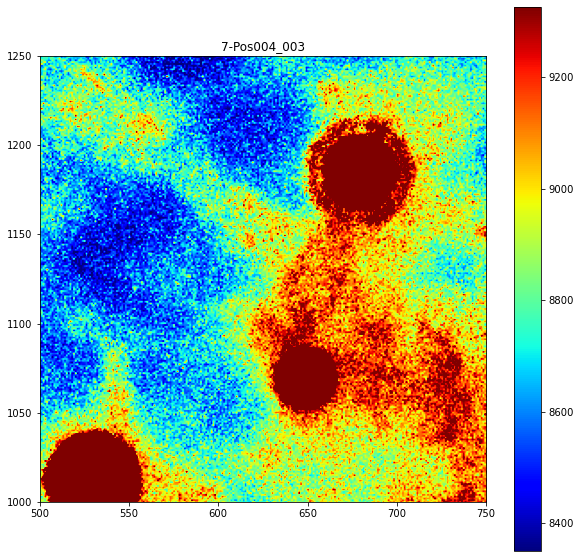

In [19]:
""" Decide on Zoom """
img = image_metadata.stkread(Position=posname, Channel='DeepBlue').max(2)
vmin,vmax = np.percentile(img.ravel(),[25,95])
plt.figure(figsize=[10,10])
plt.title(posname)
plt.imshow(img,vmin=vmin,vmax=vmax,cmap='jet')
plt.colorbar()
plt.xlim(x_window)
plt.ylim(y_window)
plt.show()

In [20]:
def plot_raw_proc(raw_img, prc_img):
    """
    """
    fig, axs = plt.subplots(1, 2, figsize=(10*2,10), sharex=True, sharey=True)
    ax = axs[0]
    vmin,vmax = np.percentile(raw_img.ravel(),[50,99.9])
    ax.set_aspect('equal')
    ax.set_title('Raw')
    g = ax.imshow(raw_img, vmin=vmin, vmax=vmax, cmap='jet')
    fig.colorbar(g, ax=ax, shrink=0.5, location='bottom', pad=0.05)
    ax.set_xlim(x_window)
    ax.set_ylim(y_window)

    ax = axs[1]
    vmin,vmax = np.percentile(prc_img.ravel(), [50,99.9])
    ax.set_aspect('equal')
    ax.set_title('Proc')
    g = ax.imshow(prc_img, vmin=vmin, vmax=vmax, cmap='jet')
    fig.colorbar(g, ax=ax, shrink=0.5, location='bottom', pad=0.05)
    ax.set_xlim(x_window)
    ax.set_ylim(y_window)
    fig.subplots_adjust(wspace=-0.3)
    plt.show()
    
    return

def plot_onepanel(ax, img, x_window=None, y_window=None, title='', cbar=False):
    """
    """
    vmin,vmax = np.percentile(img.ravel(),[50,99.9])
    ax.set_aspect('equal')
    ax.set_title(title)
    g = ax.imshow(img, vmin=vmin, vmax=vmax, cmap='jet')
    if cbar:
        fig.colorbar(g, ax=ax, shrink=0.5, location='bottom', pad=0.05)
    if x_window is not None:
        ax.set_xlim(x_window)
    if y_window is not None:
        ax.set_ylim(y_window)

    return

In [21]:
""" Project Last """
zindex = zindexes[0]
raw_imgs = {}
prc_imgs = {}
prc2_imgs = {}

for i, (readout, hybe, channel) in enumerate(bitmap):
    print(readout,hybe,channel)
    """ Raw Image Zoom"""
    self = Image_Class(metadata_path, dataset, posname, hybe, channel, zindex ,cword_config, verbose=False)
    self.load_data()
    self.project()
    raw_img = self.img
    prc_img = self.fishdata.load_data('image', 
                                      dataset=self.dataset,
                                      posname=self.posname,
                                      hybe=self.hybe,
                                      channel=self.channel,
                                      zindex=self.zindex,
                                     )
    prc2_img = prc_img/self.parameters['gain']
    
    raw_imgs[i] = raw_img
    prc_imgs[i] = prc_img
    prc2_imgs[i] = prc2_img

RS0095_cy5 hybe1 FarRed
RS0109_cy5 hybe2 FarRed
RS0175_cy5 hybe3 FarRed
RS0237_cy5 hybe4 FarRed
RS0307_cy5 hybe5 FarRed
RS0332_cy5 hybe6 FarRed
RSN9927.0_cy5 hybe7 FarRed
RSN2336.0_cy5 hybe8 FarRed
RSN1807.0_cy5 hybe9 FarRed
RS0384_cy5 hybe10 FarRed
RS0406_cy5 hybe11 FarRed
RS0451_cy5 hybe12 FarRed
RS0468_cy5 hybe13 FarRed
RS0548_cy5 hybe14 FarRed
RS64.0_cy5 hybe15 FarRed
RSN4287.0_cy5 hybe16 FarRed
RSN1252.0_cy5 hybe17 FarRed
RSN9535.0_cy5 hybe18 FarRed
RS156.0_cy5 hybe19 FarRed
RS278.0_cy5 hybe20 FarRed
RS313.0_cy5 hybe21 FarRed
RS643.0_cy5 hybe22 FarRed
RS740.0_cy5 hybe23 FarRed
RS810.0_cy5 hybe24 FarRed


In [26]:
nbits = len(bitmap)
nbits

24

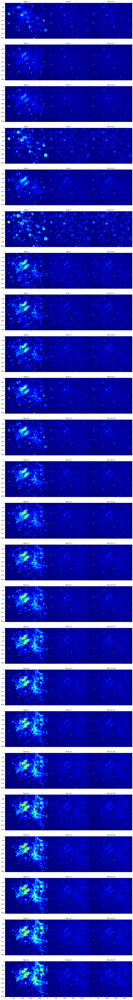

In [27]:
fig, axs = plt.subplots(nbits, 3, figsize=(6*3,6*nbits), sharex=True, sharey=True)
for i in range(nbits):
    ax = axs[i,0]
    raw_img = raw_imgs[i]
    plot_onepanel(ax, raw_img, None, None, title=f'Raw {i}')
    
    ax = axs[i, 1]
    prc_img = prc_imgs[i]
    plot_onepanel(ax, prc_img, None, None, title=f'Proc {i}')
    
    ax = axs[i, 2]
    prc2_img = prc2_imgs[i]
    plot_onepanel(ax, prc2_img, None, None, title=f'Proc V2 {i}')
    
fig.subplots_adjust(wspace=0, hspace=0.1)

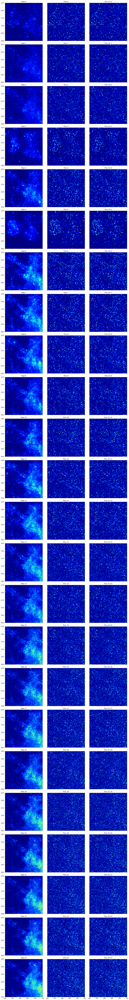

In [28]:
fig, axs = plt.subplots(nbits, 3, figsize=(6*3,6*nbits), sharex=True, sharey=True)
for i in range(nbits):
    ax = axs[i,0]
    raw_img = raw_imgs[i]
    plot_onepanel(ax, raw_img, x_window, y_window, title=f'Raw {i}')
    
    ax = axs[i, 1]
    prc_img = prc_imgs[i]
    plot_onepanel(ax, prc_img, x_window, y_window, title=f'Proc {i}')
    
    ax = axs[i, 2]
    prc2_img = prc2_imgs[i]
    plot_onepanel(ax, prc2_img, x_window, y_window, title=f'Proc V2 {i}')
    
fig.subplots_adjust(wspace=0, hspace=0.1)

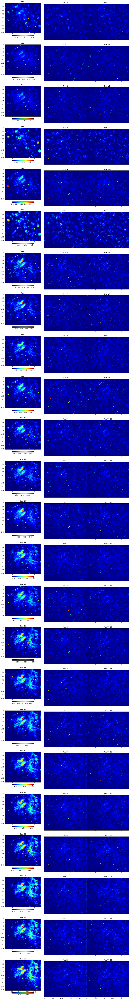

In [29]:
fig, axs = plt.subplots(nbits, 3, figsize=(6*3,6*nbits), sharex=True, sharey=True)
for i in range(nbits):
    ax = axs[i,0]
    raw_img = raw_imgs[i]
    plot_onepanel(ax, raw_img, None, None, title=f'Raw {i}', cbar=True)
    
    ax = axs[i, 1]
    prc_img = prc_imgs[i]
    plot_onepanel(ax, prc_img, None, None, title=f'Proc {i}')
    
    ax = axs[i, 2]
    prc2_img = prc2_imgs[i]
    plot_onepanel(ax, prc2_img, None, None, title=f'Proc V2 {i}')
    
fig.subplots_adjust(wspace=0, hspace=0.1)